# Identifying Areas for Light Rail Expansion in the Phoenix Area

### Introduction and Purpose

The Phoenix metro area (aka the Valley of the Sun) is rapidly growing as people from neighboring states move in for the vast desert landscape, beautiful weather, and lower cost of living. With this growth comes traffic. The area was developed mostly after car culture took hold of the US, but even great foresight has its limits. To alleviate traffic and increase mobility for non-car owners, local governments subsidize Valley Metro, an organization that builds, maintains, and runs public transit in the area. The light rail is an efficient, clean, and comfortable mode of transportation, but currently serves a very limited area. In this study, I'll define areas that would most benefit from light rail service and would provide the density and desireable attractions necessary for high ridership.

### Method for Analysis

**To identify these areas, we first need to define them.**

1. Housing Density 
    For any public transit project to be a success, it needs riders en masse. As the light rail in the area is in its infancy, we want to set these new stations/lines up for success by focusing on areas with high housing density.
2. Neighborhood Venues  
    For a destination to be desirable, it needs to have highly-rated restaurants and bars as well as entertainment (movie theaters, parks, etc.)

I'll use the Census data on occupied housing units to determine relative density of each census tract in the area.  From there, it should be easy to pare down the list of possible new station areas to only those in the top 25% in density.  
In order to understand which areas are relatively desirable based on venues, I'll look at the number of bars, restaurants, and entertainment (sports venues, movie theaters, etc) in each census tract. I'll use this to find tracts with an above average number of venues. 

## Data

#### The data used will come from three different sources

1. **US Census Data**  
    The US Census provides housing unit estimates at a census tract level. On a broad scale, these tracts can be large and might not show the detail desired. However, in a dense metro area like the one studied here, census tracts cover a small geographic area and give a high level of detail. This housing data has many features - I've pretrimmed most of them out in order to help with performance of this notebook. Additionally, the US Census provides shapefiles (used for geographic applications) that define the census tracts themselves. This will be essential when determining housing density for a given area.  
    
2. **Foursquare API**  
    Foursquare provides information on venues and searches can be centered on whatever points we want (centroids for census tracts). "Venue" is a pretty broad term in this context; the best way to define how Foursquare defines "venue" is "a place where people eat, drink, shop, workout, are entertained, or visit the doctor."
    
3. **Valley Metro**  
    Using Valley Metro's light rail station list, I'll plot the stations and use them as a guide for any new lines/stations. Additionally, there are several expansion projects in the works. These will be taken into consideration even if it's not yet possible to plot stations. This data comes in the form of a .kml file that will need to be processed with the kml2geojson library before it can be plotted and/or analyzed.

## Analysis

In [2]:
import geopandas as gpd

In [4]:
dfshape = gpd.read_file(shapepath)
dfshape.head()

,STATEFP,COUNTYFP,TRACTCE,GEOID,NAME,NAMELSAD,MTFCC,FUNCSTAT,ALAND,AWATER,INTPTLAT,INTPTLON,geometry
0,04,013,618300,04013618300,6183,Census Tract 6183,G5020,S,1413808,0,+33.6433998,-112.1431656,"POLYGON ((-112.15187 33.64731, -112.15120 33.6..."
1,04,013,116605,04013116605,1166.05,Census Tract 1166.05,G5020,S,2581154,0,+33.3848158,-112.1596188,"POLYGON ((-112.16832 33.38711, -112.16826 33.3..."
2,04,013,116606,04013116606,1166.06,Census Tract 1166.06,G5020,S,2577692,0,+33.3848675,-112.1423292,"POLYGON ((-112.15102 33.38000, -112.15101 33.3..."
3,04,013,811200,04013811200,8112,Census Tract 8112,G5020,S,2703576,0,+33.2986821,-111.8852410,"POLYGON ((-111.89451 33.29548, -111.89442 33.2..."
4,04,013,216848,04013216848,2168.48,Census Tract 2168.48,G5020,S,13398918,0,+33.5928636,-111.7877587,"POLYGON ((-111.83131 33.58970, -111.82871 33.5..."


In [5]:
dfshape.shape

(1526, 13)

**Looks like we have a lot of census tracts. That makes sense as this is for the entire state of Arizona, not just the study area. I'll pare this down to just the study area (Maricopa County) further on.**

**The most important columns will be "NAME" which is the census tract number, "INTPLAT"/"INTPLON" which are the interior lat/lon points for the tract and will be used as the centroids for venue searches, and "geometry" which defines the tract itself and will be used for plotting.**

**I want to plot the shapefile on an interactive folium map. To do so, it needs to first be transformed into a json file. Luckily, geopandas has a "to_json" method to handle this. From there, plotting is very simple.**

In [6]:
tractgeojson = dfshape.to_json()

In [7]:
import folium as fl

aztractmap = fl.Map(location = [34,-112], zoom_start=6)

In [8]:
fl.GeoJson(tractgeojson).add_to(aztractmap)

for lat, lon in zip(dfshape["INTPTLAT"],dfshape["INTPTLON"]):
    fl.CircleMarker(location=[lat,lon],radius=2,color="black",fill=True).add_to(aztractmap)

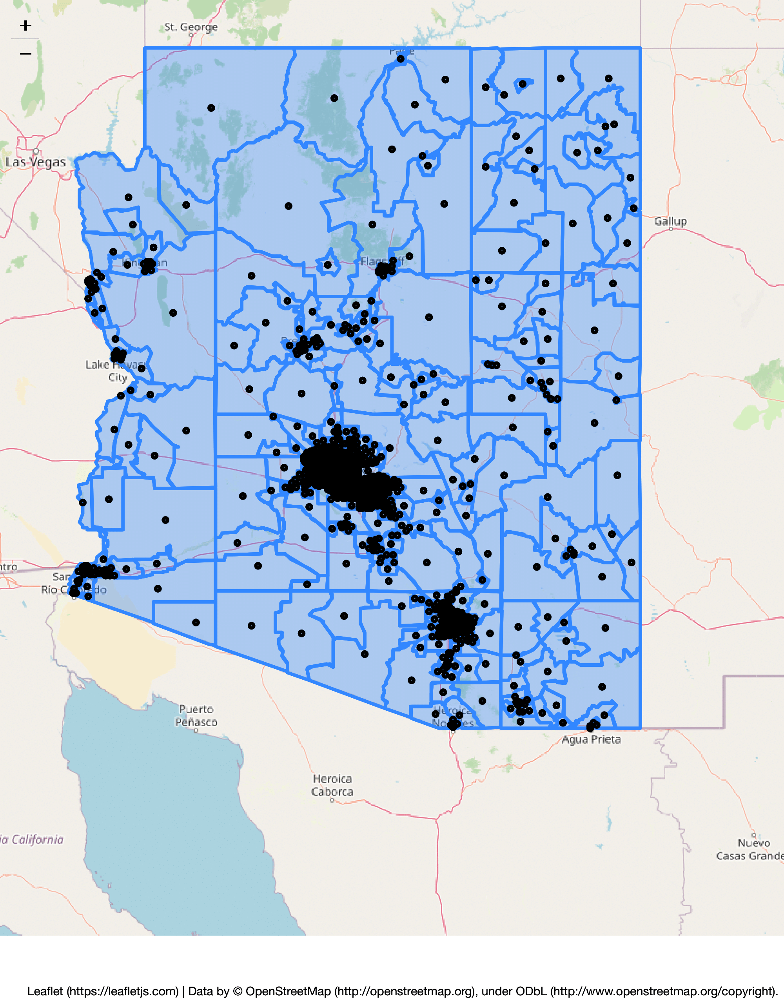

**This map will be really useful further along, but right now it's shown as a .png because the interactive Folium map increases the file size and slows performance to a crawl. What I can add, however, is that each census tract and associated centroid plotted correctly. Based on the map, the census tracts in the Phoenix metro area (Maricopa county - the South central part of the state.) are geographically small - great news because we want to look at where people live and where venues are on a micro level. Next step is to look at the area of each census tract.**

**At this point, it would speed up my processing times to trim this to just Maricopa County. The column "COUNTYFP" describes the county within AZ - Maricopa is 013.**

**To get the area, the polygons (dfshape.geometry) need to be converted to an equal area projection. Then the .area method can be used to get area in square meteres. Finally, I'll divide the area by 1,000,000 to get square kilometers. Once all that is done, I'll add the area to dfshape.**

In [8]:
dfmaricopa = dfshape[dfshape["COUNTYFP"] == "013"]

In [9]:
dfshapetemp = dfmaricopa.copy()
dfshapetemp["geometry"] = dfshapetemp["geometry"].to_crs({"proj":"cea"})
dfshapetemp["area"] = dfshapetemp["geometry"].area / 10**6

In [10]:
dfmaricopa["area"] = dfshapetemp["area"]
dfmaricopa.head()

/opt/anaconda3/lib/python3.8/site-packages/geopandas/geodataframe.py:853: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super(GeoDataFrame, self).__setitem__(key, value)


,STATEFP,COUNTYFP,TRACTCE,GEOID,NAME,NAMELSAD,MTFCC,FUNCSTAT,ALAND,AWATER,INTPTLAT,INTPTLON,geometry,area
0,04,013,618300,04013618300,6183,Census Tract 6183,G5020,S,1413808,0,+33.6433998,-112.1431656,"POLYGON ((-112.15187 33.64731, -112.15120 33.6...",1.413811
1,04,013,116605,04013116605,1166.05,Census Tract 1166.05,G5020,S,2581154,0,+33.3848158,-112.1596188,"POLYGON ((-112.16832 33.38711, -112.16826 33.3...",2.581155
2,04,013,116606,04013116606,1166.06,Census Tract 1166.06,G5020,S,2577692,0,+33.3848675,-112.1423292,"POLYGON ((-112.15102 33.38000, -112.15101 33.3...",2.577691
3,04,013,811200,04013811200,8112,Census Tract 8112,G5020,S,2703576,0,+33.2986821,-111.8852410,"POLYGON ((-111.89451 33.29548, -111.89442 33.2...",2.703574
4,04,013,216848,04013216848,2168.48,Census Tract 2168.48,G5020,S,13398918,0,+33.5928636,-111.7877587,"POLYGON ((-111.83131 33.58970, -111.82871 33.5...",13.398887


**Now I need to pull in the housing data for the study area of Maricopa County and add it to dfshape. From there, I'll divide the occupied units by census tract area to get occupied units per square kilometer for each census tract. Another important part of this step will be to trim dfshape to just tracts that fall within Maricopa County.**

In [12]:
import pandas as pd

dfhousing = pd.read_excel(housingpath,dtype={"tract":str})
dfhousing.head()

,id,goe_id,area_name,tract,total_units,occupied_units,percent_occupied
0,1400000US04013010101,4013010101,"Census Tract 101.01, Maricopa County, Arizona",101.01,3444,2394,69.5
1,1400000US04013010102,4013010102,"Census Tract 101.02, Maricopa County, Arizona",101.02,3686,2482,67.3
2,1400000US04013030401,4013030401,"Census Tract 304.01, Maricopa County, Arizona",304.01,3641,2539,69.7
3,1400000US04013030402,4013030402,"Census Tract 304.02, Maricopa County, Arizona",304.02,2609,2192,84
4,1400000US04013040502,4013040502,"Census Tract 405.02, Maricopa County, Arizona",405.02,2821,2521,89.4


**This data, from the US Census, provides a good look at total estimated housing units for each census tract as well as the occupied units and percentage of units that are occupied. For now, I'll focus on occupied units - we need to build where people live, not where they might live in the future!**

In [13]:
dfoccupied = dfhousing[["tract","occupied_units"]]

In [14]:
dfmaricopa.rename(columns={"NAME":"tract"},inplace=True)

/opt/anaconda3/lib/python3.8/site-packages/pandas/core/frame.py:4296: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().rename(


In [15]:
dfmaricopa = dfmaricopa.merge(dfoccupied,how="left",on="tract")

dfmaricopa.describe()

,ALAND,AWATER,area,occupied_units
count,9.160000e+02,9.160000e+02,916.000000,916.000000
mean,2.601487e+07,6.915693e+04,26.084033,1694.427948
std,2.126278e+08,1.101816e+06,213.098079,697.735023
min,3.265300e+05,0.000000e+00,0.326531,0.000000
25%,1.743589e+06,0.000000e+00,1.758362,1219.500000
50%,2.585212e+06,0.000000e+00,2.588656,1655.500000
75%,4.178058e+06,7.144750e+03,4.314656,2104.500000
max,3.454335e+09,3.211357e+07,3454.333396,4972.000000


In [16]:
dfmaricopa["density"] = dfmaricopa["occupied_units"] / dfmaricopa["area"]

**Great, now our two dataframes are merged and we have the density (occupied_units per square kilometer). Next I want to visualize these tracts as a choropleth with color based on density.**

In [17]:
maricopageojson = dfmaricopa.to_json()
maricopatractmap = fl.Map(location=[33.51,-111.97],zoom_start=10)
fl.GeoJson(maricopageojson).add_to(maricopatractmap)

In [18]:
densityscale = (dfmaricopa["density"].quantile((0,.25,.5,.75,1))).to_list()

maricopachoro = maricopatractmap
maricopachoro.choropleth(geo_data=dfmaricopa,
                        data=dfmaricopa,
                        columns=["tract","density"],
                        key_on="feature.properties.tract",
                        fill_color="YlGnBu",
                        threshold_scale=densityscale,
                        fill_opacity=.5,
                        line_opacity=.2,
                        smooth_factor=0)

/opt/anaconda3/lib/python3.8/site-packages/folium/folium.py:409: FutureWarning: The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.
  warnings.warn(


**Now that we have a choropleth map of density, I want to add in the existing light rail stations to examine how the system serves the population and give a reference for our future stations to be determined further on.**

**The list of stations comes from Wikipedia in the form of a .kml file. The kml2geojson library makes converting this filetype very very simple and outputs a file to the chosen directory that can be plotted just like any other geojson file after some basic cleaning. Before plotting, I'll pull the file into a geopandas dataframe to help clean the data.**

In [20]:
import kml2geojson

kml2geojson.convert(stationspath,outputpath)

In [22]:
dfstations = gpd.read_file(geostationspath)
dfstations.head()

,name,description,geometry
0,19th Ave/Dunlap station,"<br>Source: Wikipedia article <a href=""https:/...",POINT Z (-112.10090 33.56729 0.00000)
1,Northern/19th Ave station,"<br>Source: Wikipedia article <a href=""https:/...",POINT Z (-112.09966 33.55217 0.00000)
2,Glendale/19th Ave station,"<br>Source: Wikipedia article <a href=""https:/...",POINT Z (-112.09973 33.53737 0.00000)
3,19th Ave/Montebello station,"<br>Source: Wikipedia article <a href=""https:/...",POINT Z (-112.09982 33.52038 0.00000)
4,19th Ave/Camelback station,"<br>Source: Wikipedia article <a href=""https:/...",POINT Z (-112.09894 33.50932 0.00000)


**So cleaning will mostly focus on getting lat/lon out of the 3D "geometry" column. This is done with two simple methods - x and y.**

In [23]:
dfstations["Lat"] = dfstations["geometry"].y
dfstations["Lon"] = dfstations["geometry"].x

In [24]:
dfstations.drop(["description","geometry"],axis=1,inplace=True)
dfstations.rename(columns={"name":"Station"},inplace=True)
dfstations.head()

,Station,Lat,Lon
0,19th Ave/Dunlap station,33.567286,-112.100897
1,Northern/19th Ave station,33.552167,-112.099664
2,Glendale/19th Ave station,33.537367,-112.099731
3,19th Ave/Montebello station,33.520375,-112.099819
4,19th Ave/Camelback station,33.509317,-112.098939


**Now to plot the existing stations on the choropleth map of Maricopa County.**

In [25]:
stationsfg = fl.FeatureGroup(overlay=True,show=True).add_to(maricopachoro)

for station, lat, lon in zip(dfstations["Station"],dfstations["Lat"],dfstations["Lon"]):
    stationsfg.add_child(fl.CircleMarker(location=[lat,lon],
                                         radius=5,
                                         color="black",
                                         weight=1,
                                         fill=True,
                                         fill_opacity=1,
                                         fill_color="red",
                                         tooltip=station,
                                         popup=station))
    
maricopachoro

Ok, now we have a good looking choropleth map based on the occupied housing units per square kilometer of each census tract overlayed with existing light rail stations. This gives a micro-scale look at where people actually live and how the light rail currently serves them. This is an important view because, when planning our new light rail lines/stations, we want to focus on endpoints where people live and lines that run through (and have stops) where there are desirable venues for them to enjoy once they get off the train.

Beyond what is shown on the map, there are two more lines in the building and planning stages: one that goes due south from downtown Phoenix (line is indicated by the two already-completed stations south of the main line) and another that goes due west of downtown. For reference, lines running north and east meet in the middle of downtown. Based on what exists and what is being planned, it's clear the planning is "all roads lead to Rome" - a hub and spoke system that serves to bring commuters into the business hub of downtown from the surrounding areas. Decades of research tells us that this is not the best way to design a public transit system. People need to be able to travel neighborhood to neighborhood without long trips to a central hub as most potential rides are not to and from work but instead to leisure and life destinations. Forcing riders to cover extra miles is a recipe for empty trains. When deciding on lines/stations for our hypothetical expansion, I'll take this into account.

**The next step is to trim the list of census tracts in Maricopa County to just those in the top 25% of density - about 229 tracts (of the original 916). This is done for two reasons: to make sure the focus remains on high-density areas and to make finding venues for each tract more efficient. Pulling data from an API can be time consuming resource-heavy so it's best to trim the dataset down now.** 

In [26]:
dfhighdensity = dfmaricopa.sort_values("density",ascending=False)
dfhighdensity = dfhighdensity.head(229)
dfhighdensity.reset_index(drop=True,inplace=True)
dfhighdensity["INTPTLAT"] = dfhighdensity["INTPTLAT"].str.replace("+","")
dfhighdensity.head()

,STATEFP,COUNTYFP,TRACTCE,GEOID,tract,NAMELSAD,MTFCC,FUNCSTAT,ALAND,AWATER,INTPTLAT,INTPTLON,geometry,area,occupied_units,density
0,04,013,619100,04013619100,6191,Census Tract 6191,G5020,S,326530,0,33.6439454,-112.0633645,"POLYGON ((-112.06557 33.64757, -112.06427 33.6...",0.326531,1420,4348.747365
1,04,013,319101,04013319101,3191.01,Census Tract 3191.01,G5020,S,330654,0,33.4166650,-111.9220739,"POLYGON ((-111.92629 33.41915, -111.92611 33.4...",0.330654,1293,3910.430001
2,04,013,217204,04013217204,2172.04,Census Tract 2172.04,G5020,S,611191,5869,33.4994116,-111.9142362,"POLYGON ((-111.91748 33.49855, -111.91747 33.4...",0.617057,1947,3155.301520
3,04,013,422103,04013422103,4221.03,Census Tract 4221.03,G5020,S,726403,0,33.3966747,-111.8698091,"POLYGON ((-111.87461 33.39335, -111.87461 33.3...",0.726401,2273,3129.126950
4,04,013,422107,04013422107,4221.07,Census Tract 4221.07,G5020,S,635211,0,33.3971105,-111.8612601,"POLYGON ((-111.86584 33.39681, -111.86582 33.3...",0.635209,1864,2934.468065


The next step in this process is to determine just where those desirable venues are via data from Foursquare. For simplicity, we'll use the census tract centroids with a radius of 1000m (reasonable walking distance) as the search nodes. These centroids will also serve as the points where stations will go within our chosen tracts. While this will lead to some theoretical stations on top of houses or in intersections, it will give us a good idea of where future stations should aim to serve.

**Fist we need a function to get Foursqare venues within 1000m of each tract centroid.**

In [28]:
import requests

def getnearbyvenues(tracts, lats, lons, radius=1000):
    
    venues_list=[]
    for tract, lat, lon in zip(tracts, lats, lons):
        url = f"https://api.foursquare.com/v2/venues/explore?&client_id={client_id}&client_secret={client_secret}&v={version}&ll={lat},{lon}&radius={radius}&limit={limit}"
        
        results = requests.get(url).json()["response"]["groups"][0]["items"]
        
        venues_list.append([(tract,lat,lon,
                             v["venue"]["name"],
                             v["venue"]["location"]["lat"],
                             v["venue"]["location"]["lng"],
                             v["venue"]["categories"][0]["name"]) for v in results])
    
    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ["tract","tract lat","tract lon",
                            "venue","venue lat","venue lon",
                            "venue cat"]
    
    return(nearby_venues)

**Now to run the function for the densest 25% of tracts and get each of their walkable venues.**

In [29]:
maricopavenues = getnearbyvenues(tracts = dfhighdensity["tract"],
                                lats = dfhighdensity["INTPTLAT"],
                                lons = dfhighdensity["INTPTLON"])
maricopavenues.head()

,tract,tract lat,tract lon,venue,venue lat,venue lon,venue cat
0,6191,33.6439454,-112.0633645,Cold Stone Creamery,33.640796,-112.065047,Ice Cream Shop
1,6191,33.6439454,-112.0633645,Raising Cane's Chicken Fingers,33.641029,-112.059303,Fried Chicken Joint
2,6191,33.6439454,-112.0633645,Blaze Pizza,33.641424,-112.060009,Pizza Place
3,6191,33.6439454,-112.0633645,Planet Fitness,33.641305,-112.069496,Gym
4,6191,33.6439454,-112.0633645,Yogurtini,33.639847,-112.066936,Frozen Yogurt Shop


**Great, now we have up to 100 venues per census tract. Let's explore the dataset a little bit to get a feel for the kinds of places we have.**

In [91]:
catcounts = maricopavenues.groupby("venue cat").count()
catcounts = catcounts.sort_values("venue",ascending=False)
catcounts = catcounts["tract"]
catcounts

venue cat
Convenience Store                           382
Pizza Place                                 372
Mexican Restaurant                          324
Fast Food Restaurant                        319
Coffee Shop                                 226
Sandwich Place                              223
Grocery Store                               166
Intersection                                154
Video Store                                 152
Pharmacy                                    142
Park                                        134
Chinese Restaurant                          132
Bar                                         118
Discount Store                              114
Hotel                                       113
American Restaurant                         110
Gym                                          97
Bank                                         92
Burger Joint                                 83
Cosmetics Shop                               82
Gas Station                   

**This is a diverse list of businesses! Seems like we have a ton of food and drink as well as sports stadiums (Phoenix hosts MLB Spring Training every year), gyms, theaters, and outdoor activities. That said, there are a couple of things we need to drop from our dataset - convenience stores/gas stations, intersections, and car washes. Reasoning is simple - gas stations, intersections, and car washes more or less require cars and their presence doesn't tell us much about an area. Convenience stores will be removed because it's extremely unlikely anyone will ride a train to one when they probably have one within walking distance anyway.**

**After removing these types of venues, I'll group the dataframe by census tract and add the venue counts to the dense tracts dataframe. From there, I'll do a little cleaning and sort the tracts based on occupied housing density and venue density.**

In [92]:
maricopavenues = maricopavenues[~maricopavenues["venue cat"].isin(["Convenience Store","Intersection","Gas Station","Car Wash"])]
maricopavenues.reset_index(inplace=True)
maricopavenuesgrouped = maricopavenues.groupby("tract").count()
maricopavenuesgrouped.reset_index(inplace=True)
maricopavenuesgrouped.head()

,tract,index,tract lat,tract lon,venue,venue lat,venue lon,venue cat
0,1032.10,78,78,78,78,78,78,78
1,1032.17,11,11,11,11,11,11,11
2,1033.02,7,7,7,7,7,7,7
3,1033.04,56,56,56,56,56,56,56
4,1033.05,34,34,34,34,34,34,34


In [93]:
dffinal = dfhighdensity.join(maricopavenuesgrouped.set_index("tract"),on="tract")
dffinal.drop(["index","tract lat","tract lon","venue lat","venue lon","venue cat"],axis=1,inplace=True)
dffinal["density"] = dffinal["density"].astype(int)
dffinal["occupied_units"] = dffinal["occupied_units"].astype(int)
dffinal["venue_density"] = (dffinal["venue"] / dffinal["area"]).astype(int)
dffinal = dffinal.sort_values(["density","venue_density"],ascending=False)
dffinal.reset_index(drop=True,inplace=True)
dffinal.head()

,STATEFP,COUNTYFP,TRACTCE,GEOID,tract,NAMELSAD,MTFCC,FUNCSTAT,ALAND,AWATER,INTPTLAT,INTPTLON,geometry,area,occupied_units,density,venue,venue_density
0,04,013,619100,04013619100,6191,Census Tract 6191,G5020,S,326530,0,33.6439454,-112.0633645,"POLYGON ((-112.06557 33.64757, -112.06427 33.6...",0.326531,1420,4348,63,192
1,04,013,319101,04013319101,3191.01,Census Tract 3191.01,G5020,S,330654,0,33.4166650,-111.9220739,"POLYGON ((-111.92629 33.41915, -111.92611 33.4...",0.330654,1293,3910,99,299
2,04,013,217204,04013217204,2172.04,Census Tract 2172.04,G5020,S,611191,5869,33.4994116,-111.9142362,"POLYGON ((-111.91748 33.49855, -111.91747 33.4...",0.617057,1947,3155,52,84
3,04,013,422103,04013422103,4221.03,Census Tract 4221.03,G5020,S,726403,0,33.3966747,-111.8698091,"POLYGON ((-111.87461 33.39335, -111.87461 33.3...",0.726401,2273,3129,48,66
4,04,013,422107,04013422107,4221.07,Census Tract 4221.07,G5020,S,635211,0,33.3971105,-111.8612601,"POLYGON ((-111.86584 33.39681, -111.86582 33.3...",0.635209,1864,2934,64,100


**Now we really have some actionable data. I'll plot this on a map similar to the housing density map above and will overlay existing light rail stations. The difference here is color will be based on venue density as we have already trimmed the data to just the tracts that rank in the top 25% of housing density. This map will be the basis for determing where new lines/stations should go.**

In [120]:
finalgeojson = dffinal.to_json()
highdensitytractmap = fl.Map(location=[33.51,-111.97],zoom_start=10)
fl.GeoJson(finalgeojson).add_to(highdensitytractmap)

In [121]:
densityscale = (dffinal["venue_density"].quantile((0,.25,.5,.75,1))).to_list()

finalchoro = highdensitytractmap
finalchoro.choropleth(geo_data=dffinal,
                        data=dffinal,
                        columns=["tract","venue_density"],
                        key_on="feature.properties.tract",
                        fill_color="YlGnBu",
                        threshold_scale=densityscale,
                        fill_opacity=.5,
                        line_opacity=.2,
                        smooth_factor=0)

centroidsfg = fl.FeatureGroup(overlay=True,show=True).add_to(finalchoro)

for tract, lat, lon in zip(dffinal["tract"],dffinal["INTPTLAT"],dffinal["INTPTLON"]):
    centroidsfg.add_child(fl.CircleMarker(location=[lat,lon],
                                          radius=3,
                                          color="black",
                                          weight=1,
                                          fill=True,
                                          fill_opacity=1,
                                          tooltip=tract,
                                          popup=f"{tract} - [{lat} , {lon}]"))

stationsfg = fl.FeatureGroup(overlay=True,show=True).add_to(finalchoro)

for station, lat, lon in zip(dfstations["Station"],dfstations["Lat"],dfstations["Lon"]):
    stationsfg.add_child(fl.CircleMarker(location=[lat,lon],
                                         radius=5,
                                         color="black",
                                         weight=1,
                                         fill=True,
                                         fill_opacity=1,
                                         fill_color="red",
                                         tooltip=station,
                                         popup=station))
    

#finalchoro

**Looks good! In the last step, I'll manually plot out two new lines and several stations for each one. I'll call out census tract lat/lon for station locations using the map of all census tracts above as a reference.**

In [122]:
# scottsdale - maryvale line

scottsdalemaryvale = [[33.5019583, -111.9349494],
 [33.5002341, -111.9893410],
 [33.4988620, -112.0041770],
 [33.4913915, -112.0215630],
 [33.5042337, -112.0540658],
 [33.508528, -112.075381],
 [33.509097, -112.083361],
 [33.509317, -112.098939],
 [33.5022299, -112.1776189],
 [33.5054114, -112.2093948],
 [33.5015444, -112.2250233],
 [33.5017559, -112.2335657],
 [33.5014783, -112.2420804],
 [33.5014833, -112.2507274]]

# scottsdale - tempe line

scottsdaletempe = [[33.507133, -111.9170600],
 [33.5019583, -111.9349494],
 [33.4863686, -111.9386785],
 [33.4729197, -111.9348731],
 [33.4620164, -111.9328124],
 [33.4553353, -111.9348913],
 [33.414544, -111.916981],
 [33.4001798, -111.9349062],
 [33.3857391, -111.9351642],
 [33.3703792, -111.9155206]]

In [125]:
fl.PolyLine(scottsdalemaryvale,smooth_factor=0,weight=5,color="purple").add_to(finalchoro)
fl.PolyLine(scottsdaletempe,smooth_factor=0,weight=5,color="purple").add_to(finalchoro)

finalchoro

**And now we have our brand new people-focused light rail lines in green on the map! These two lines would do wonders to connect parts of the city where transactional business is done. On top of that, they run through the most densly populated areas which means we have a lot of potential riders.**

### Conclusion

**The goal of this project was to determine where light rail service in the Phoenix metro area could be expanded to best serve the people and businesses in the area. I believe we've succeeded in that goal - we have two new lines that run opposite to the existing lines, through densly populated areas, and into places with plenty of bars, restaurants, and venues for entertainment. If you know the Phoenix area, you know we've hit Old Town Scottsdale (a walkable location with shops, bars, and restaurants), Tempe (home to Arizona State University), and Westgate (a place with plenty of great restaurants, bars, and sports stadiums for NFL and NHL teams). This kind of service would have benefits for residents, businesses, and the city as a whole - imagine how incidents of DUI would drop if this many party locations were accessible without a car? I believe this project can be deemed a success, though it's certainly far from perfect - there are a lot of more factors to be considered when expanding public transit.**

#### Next Steps

**From here, I think it would be prudent to expand the project ideas by determining how venues in each of these "destination areas" are rated; we want to route people to places they want to go! I'd also be interested in looking at traffic studies for the area - how could our potenital expansions change traffic patterns and car usage?**

### Citations

**Census tract and housing data - https://data.census.gov**

**Existing light rail stations - https://en.wikipedia.org/wiki/List_of_Valley_Metro_Rail_stations**

**Venue data - https://foursquare.com/  API**